In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image
import requests
from io import BytesIO

# OpenCV 출력
from google.colab.patches import cv2_imshow

## 컬러매핑(Color Mapping)
* 그레이스케일(Grayscale), 트루컬러(Truecolor, RGB) 이미지
* cv2.cvtColor()

## 색공간의 종류
* RGB
 - 빛의 3원색인 빨강(R), 초록(G), 파랑(B) 비율을 통해 색을 표현
 - 가산 혼합 : 빛을 섞을수록 밝아짐
 - 모니터, TV, 빔프로젝터 ... : 디스플레이 장비
* CMYK
 - 청록색(Cyan), 자홍색(Magenta), 노란색(Yellow)
 - 감산 혼합 : 빛을 섞을수록 어두워짐
 - 컬러프린터, 인쇄
* YCbCr
 - 디지털TV에서 사용하는 색공간
 - 아날로그 신호 색공간(YPbPr)을 디지털화
* HSV
 - H(Hue) : 색상, 0~179(int)
 -- 색의 종류 : 빨간색, 노란색 ...
 - S(Saturation) : 채도, 0~255(int)
 -- 색의 순도
 -- 채도가 높으면 맑은 색
 -- 채도가 낮으면 탁한 색
 - V(Value) : 명도, 0~255(int)
 -- 빛의 세기
 -- 명도가 높으면 밝은 색
 -- 명도가 낮으면 어두운 색

In [ ]:
!wget -O dog1.jpg https://cdn.pixabay.com/photo/2018/10/01/09/21/pets-3715733_960_720.jpg

--2024-05-09 01:08:10--  https://cdn.pixabay.com/photo/2018/10/01/09/21/pets-3715733_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 172.64.147.160, 104.18.40.96, 2606:4700:4400::6812:2860, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|172.64.147.160|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 92662 (90K) [binary/octet-stream]
Saving to: ‘dog1.jpg’

dog1.jpg            100%[===================>]  90.49K  --.-KB/s    in 0.002s  

2024-05-09 01:08:11 (40.0 MB/s) - ‘dog1.jpg’ saved [92662/92662]



array([[[140, 123, 214],
        [140, 123, 214],
        [141, 124, 215],
        ...,
        [170, 145, 235],
        [170, 146, 234],
        [169, 145, 233]],

       [[140, 123, 214],
        [141, 124, 215],
        [141, 124, 215],
        ...,
        [170, 145, 235],
        [169, 145, 233],
        [169, 145, 233]],

       [[141, 124, 215],
        [141, 124, 215],
        [141, 124, 215],
        ...,
        [170, 145, 235],
        [169, 145, 233],
        [169, 145, 233]],

       ...,

       [[147, 133, 211],
        [147, 133, 211],
        [147, 133, 211],
        ...,
        [175, 151, 229],
        [175, 151, 229],
        [175, 151, 229]],

       [[146, 133, 211],
        [146, 133, 211],
        [146, 133, 211],
        ...,
        [175, 151, 229],
        [175, 151, 229],
        [176, 152, 230]],

       [[146, 133, 211],
        [146, 133, 211],
        [146, 133, 211],
        ...,
        [177, 153, 231],
        [177, 153, 231],
        [178, 154, 232]]], dtype=uint8)
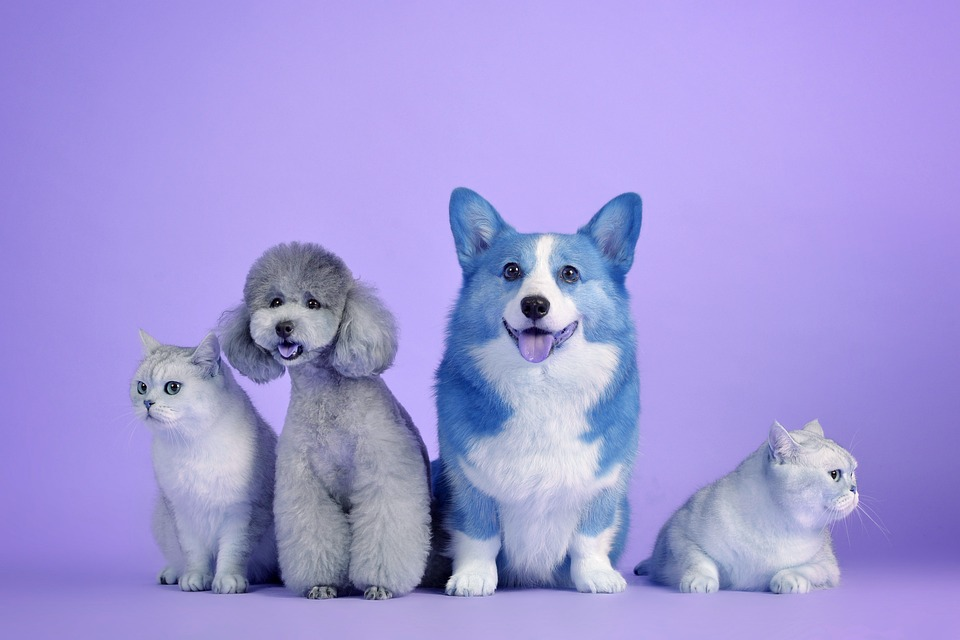

In [ ]:
image=cv2.imread('/content/dog1.jpg')
image

In [ ]:
print(image.shape)
print(type(image))

(640, 960, 3)
<class 'numpy.ndarray'>


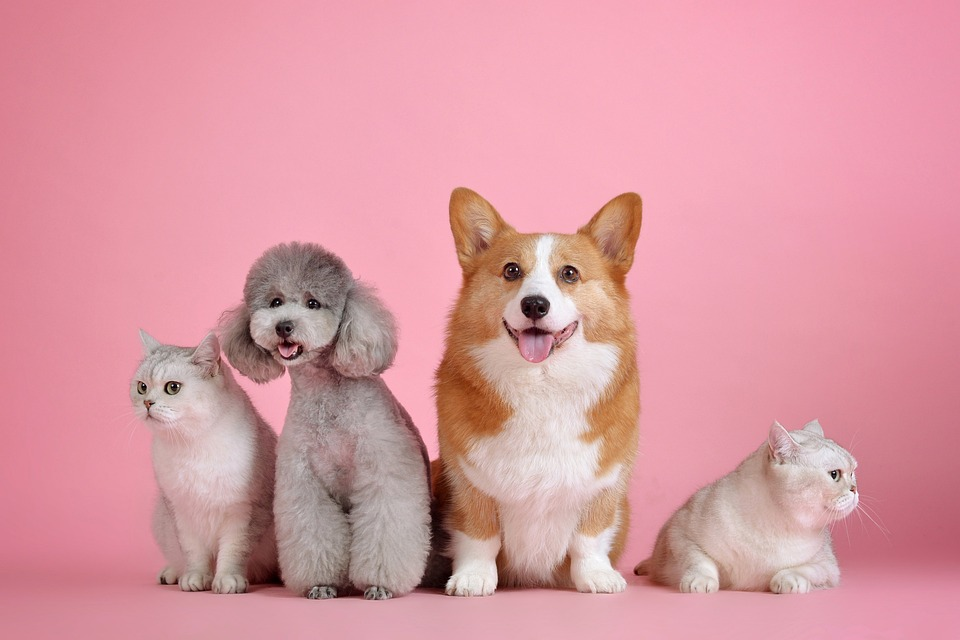

In [ ]:
cv2_imshow(image)

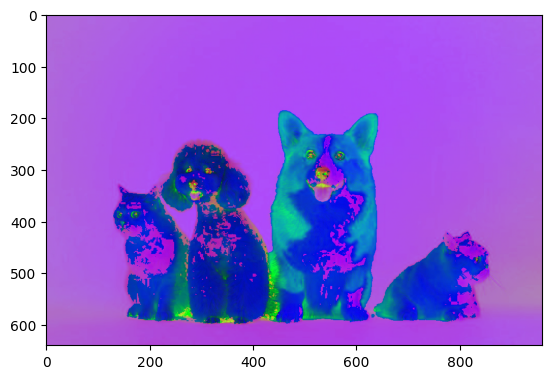

In [ ]:
image_hsv=cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
plt.imshow(image_hsv)
plt.show()

array([[[174, 108, 214],
        [174, 108, 214],
        [174, 108, 215],
        ...,
        [172,  98, 235],
        [172,  96, 234],
        [172,  96, 233]],

       [[174, 108, 214],
        [174, 108, 215],
        [174, 108, 215],
        ...,
        [172,  98, 235],
        [172,  96, 233],
        [172,  96, 233]],

       [[174, 108, 215],
        [174, 108, 215],
        [174, 108, 215],
        ...,
        [172,  98, 235],
        [172,  96, 233],
        [172,  96, 233]],

       ...,

       [[175,  94, 211],
        [175,  94, 211],
        [175,  94, 211],
        ...,
        [171,  87, 229],
        [171,  87, 229],
        [171,  87, 229]],

       [[175,  94, 211],
        [175,  94, 211],
        [175,  94, 211],
        ...,
        [171,  87, 229],
        [171,  87, 229],
        [171,  86, 230]],

       [[175,  94, 211],
        [175,  94, 211],
        [175,  94, 211],
        ...,
        [171,  86, 231],
        [171,  86, 231],
        [171,  86, 232]]], dtype=uint8)
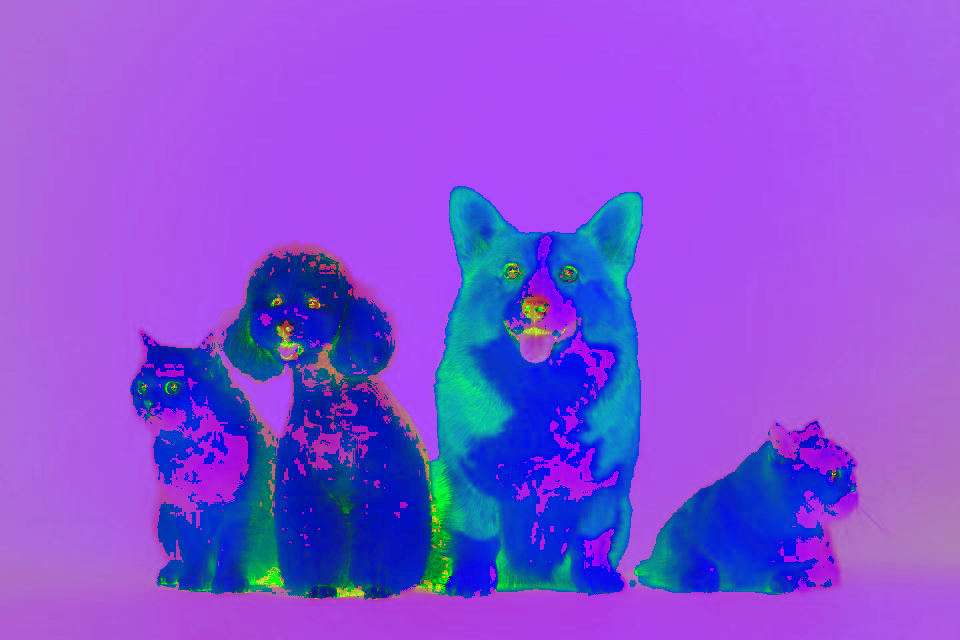

In [ ]:
image_hsv

In [ ]:
print(np.max(image_hsv[:,0,0]))
print(np.min(image_hsv[:,0,0]))

175
173


# HLS
* H(Heu) : 색상, 0~179(int)
* L(Lightness) : 밝기
* S(Saturation) : 채도, 0~255(int)
* HSV와 사람이 실제로 컬러를 인식하는 방식

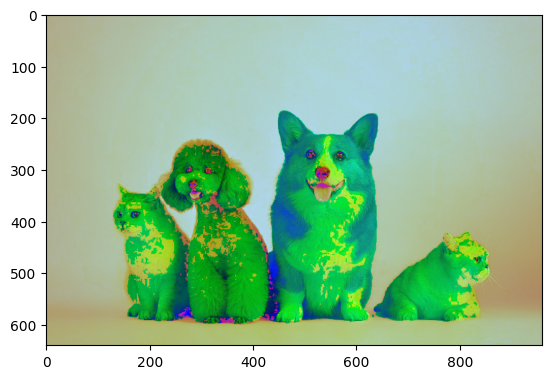

In [ ]:
image_hls=cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
plt.imshow(image_hls)
plt.show()

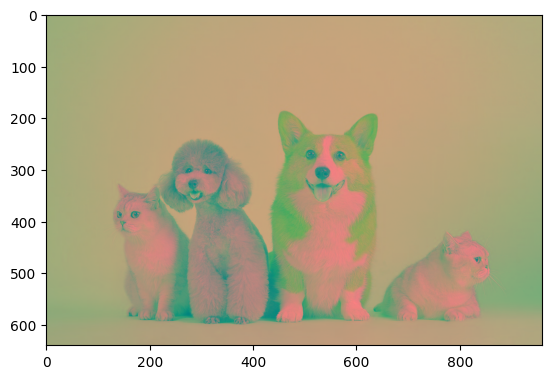

In [ ]:
image_ycrcb=cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
plt.imshow(image_ycrcb)
plt.show()

# GrayScale
* 밝기 정보를 0~255로 구분하여 표현(256개로 표현)
* 0 : 검은색
* 255 : 흰색

array([[152, 152, 153, ..., 175, 175, 174],
       [152, 153, 153, ..., 175, 174, 174],
       [153, 153, 153, ..., 175, 174, 174],
       ...,
       [158, 158, 158, ..., 177, 177, 177],
       [158, 158, 158, ..., 177, 177, 178],
       [158, 158, 158, ..., 179, 179, 180]], dtype=uint8)
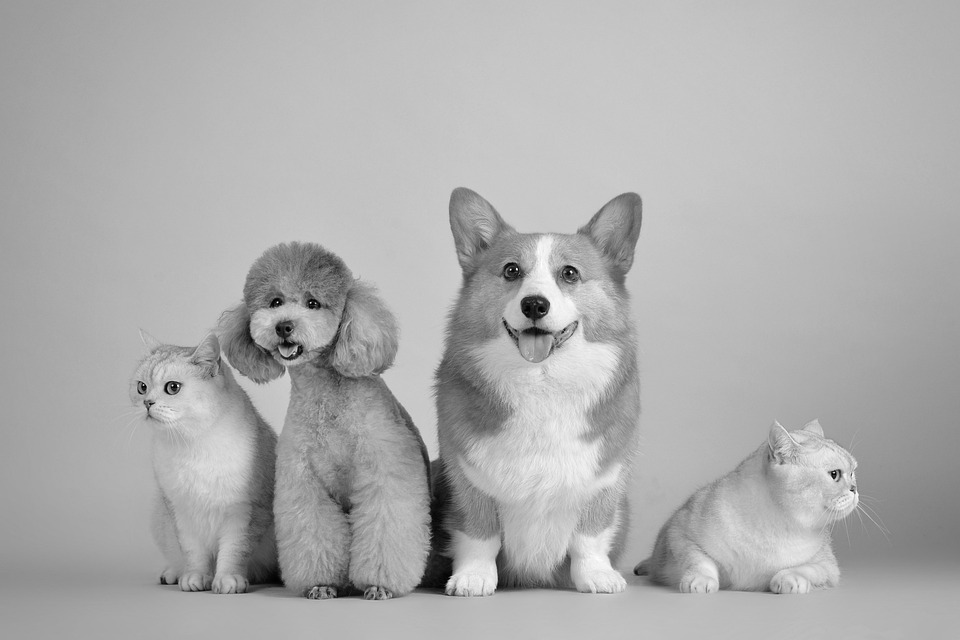

In [ ]:
image_gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image_gray

In [ ]:
print(np.min(image_gray), np.max(image_gray))

1 255


## 히스토그램(Histogram)
* 이미지, 영상의 밝기 분포를 그래프로 표현하는 방식
* 이미지(영상) 전체의 밝기 분포, 채도(맑음, 탁함, 밝음, 어두움) 확인 가능

# 용어 정리
* BINS
 - 히스토그램의 x축의 간격
 - 0~255(256=2^8)
 - ex) 2 : 256/2=128 x축으로 표현
 - OpenCV에서는 histSize
* DIMS
 - 이미지(영상)에서 조사하고자하는 값
 - 빛의 강도, RGB 값인지 결정
* RANGE
 - 측정하고자 하는 값의 범위

* cv2.calcHist()
 - image
 - channels : grayscale[0], color[0], [0], 0, 1
 - mask : 이미지 분석 영역, None(전체 영역)
 - histSize : BINS 값[256]
 - range : 범위값[0,256]

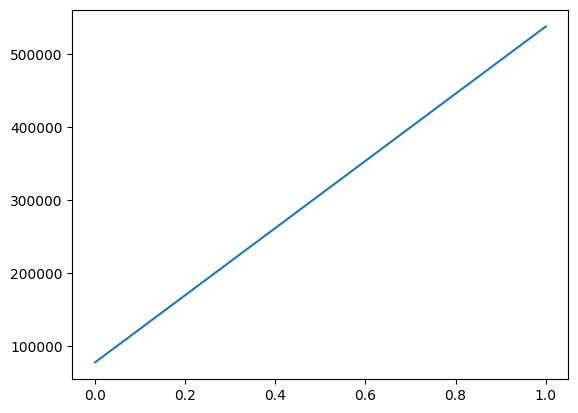

In [ ]:
image_hist=cv2.calcHist([image],[0],None,[2],[0,256])
plt.plot(image_hist)
plt.show()

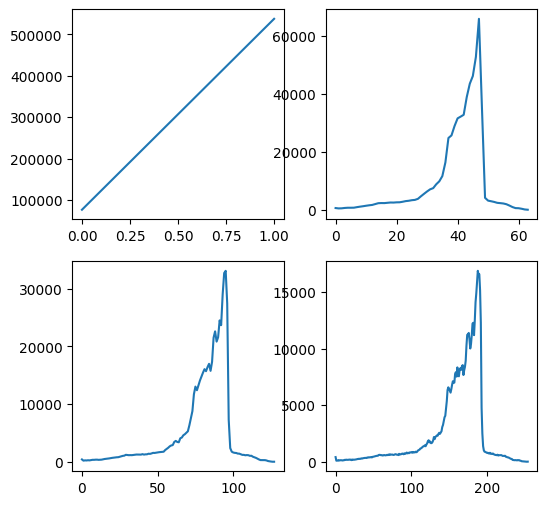

In [ ]:
image_hist1=cv2.calcHist([image],[0],None,[2],[0,256])
image_hist2=cv2.calcHist([image],[0],None,[64],[0,256])
image_hist3=cv2.calcHist([image],[0],None,[128],[0,256])
image_hist4=cv2.calcHist([image],[0],None,[255],[0,256])
plt.figure(figsize=(6,6))
plt.subplot(221)
plt.plot(image_hist1)
plt.subplot(222)
plt.plot(image_hist2)
plt.subplot(223)
plt.plot(image_hist3)
plt.subplot(224)
plt.plot(image_hist4)
plt.show()

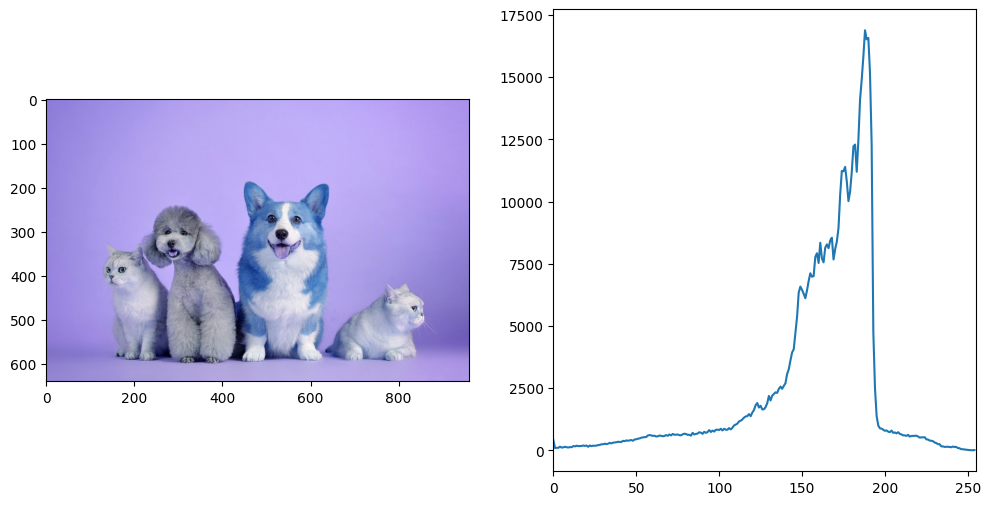

In [ ]:
image_hist4 = cv2.calcHist([image],[0],None,[255],[0,256])
plt.figure(figsize=(12,6))
plt.subplot(121)
plt.imshow(image, 'gray')
plt.subplot(122)
plt.plot(image_hist4)
plt.xlim([0, 255]) # x축 범위 설정
plt.show()

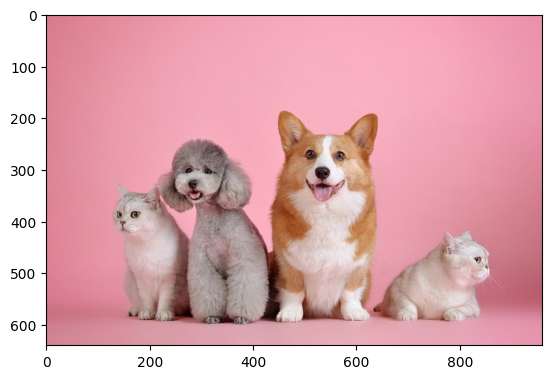

In [ ]:
image_rgb=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()

In [ ]:
mask=np.zeros(image_rgb.shape[:2], np.uint8)
mask[150:400, 400:700]=255 # 강아지 얼굴 부분만 마스크

In [ ]:
mask_image=cv2.bitwise_and(image_rgb,image_rgb, mask=mask)

In [ ]:
image_hist = cv2.calcHist([image_rgb], [1], None, [255], [0,256])
mask_hist = cv2.calcHist([mask_image], [1], mask, [255], [0,256])

Text(0.5, 1.0, 'Histogram')

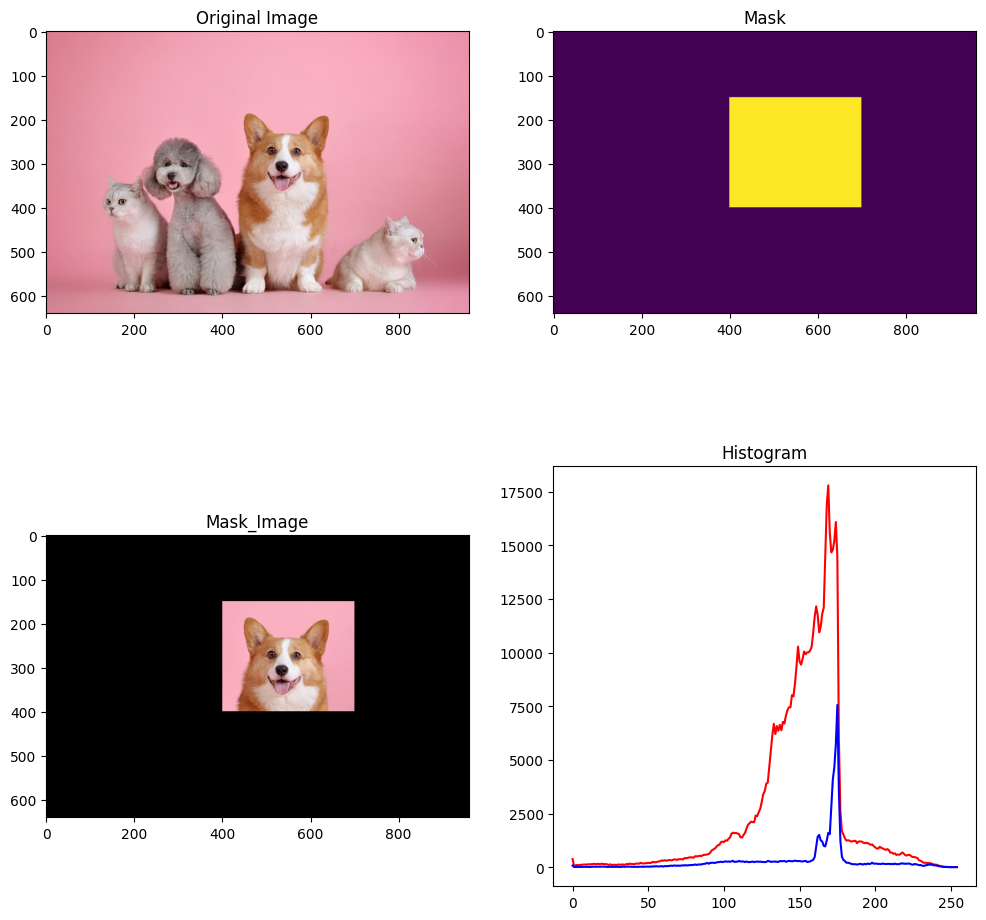

In [ ]:
plt.figure(figsize=(12,12))
plt.subplot(221)
plt.imshow(image_rgb)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(mask)
plt.title('Mask')

plt.subplot(223)
plt.imshow(mask_image)
plt.title('Mask_Image')

plt.subplot(224)
plt.plot(image_hist, color='r')
plt.plot(mask_hist, color='b')
plt.title('Histogram')

# 히스토그램 평탄화
* 이미지의 히스토그램이 특정 영역에 집중되어 있으면 좋은 이미지라 할 수 없음

(640, 960, 3)


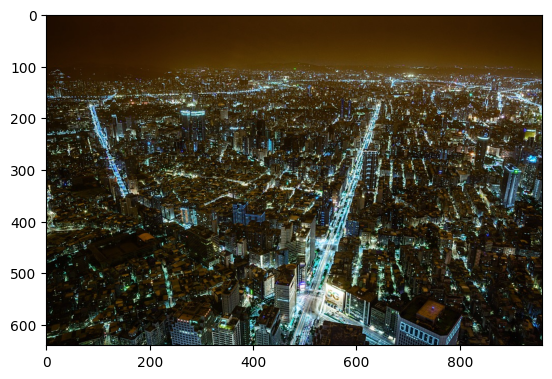

In [ ]:
night=cv2.imread('/content/night.jpg')
print(night.shape)
plt.imshow(night)
plt.show()

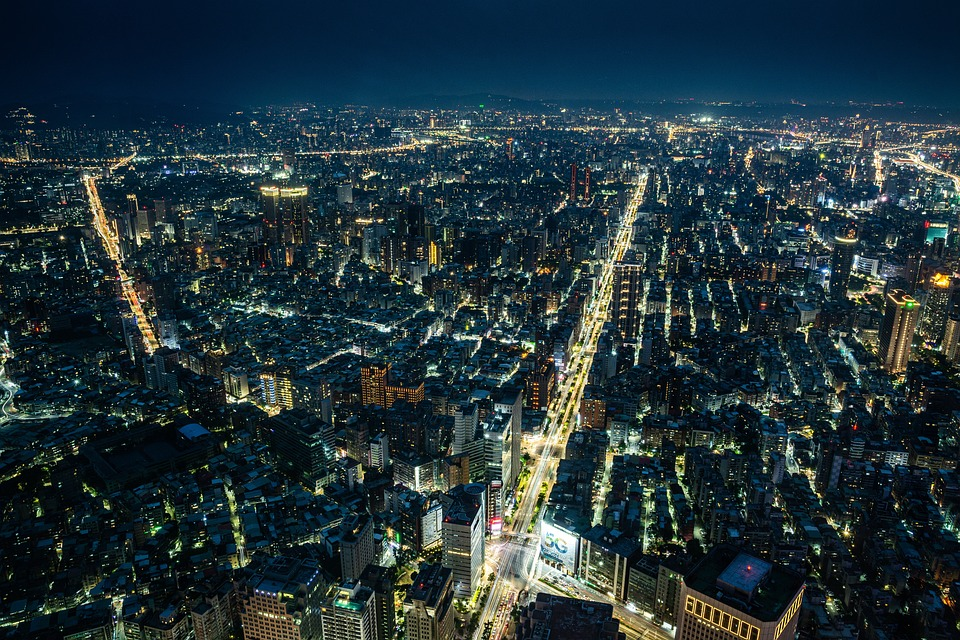

In [ ]:
cv2_imshow(night)

In [ ]:
night_01=cv2.imread('/content/night.jpg',0)

In [ ]:
print(night_01)
print(night_01.shape)

[[11 11 11 ... 18 18 18]
 [11 11 11 ... 18 18 18]
 [11 11 11 ... 18 18 18]
 ...
 [ 5  7  9 ...  6  7 10]
 [ 7  9  8 ...  6  7  9]
 [ 5  3  1 ...  7  6  7]]
(640, 960)


# Numpy를 이용한 평탄화

In [ ]:
hist, bins=np.histogram(night_01.flatten(),256,[0,256])

In [ ]:
cdf = hist.cumsum()
cdf_m = np.ma.masked_equal(cdf, 0)

cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
cdf = np.ma.filled(cdf_m, 0).astype('uint8')

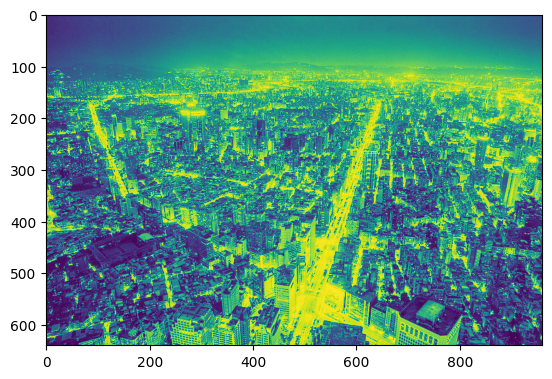

In [ ]:
night_cdf = cdf[night_01]
plt.imshow(night_cdf)
plt.show()

In [ ]:
night_hist = cv2.calcHist([night_01], [0], None, [255], [0,256])
night_cdf_hist = cv2.calcHist([night_01], [0], None, [255], [0,256])

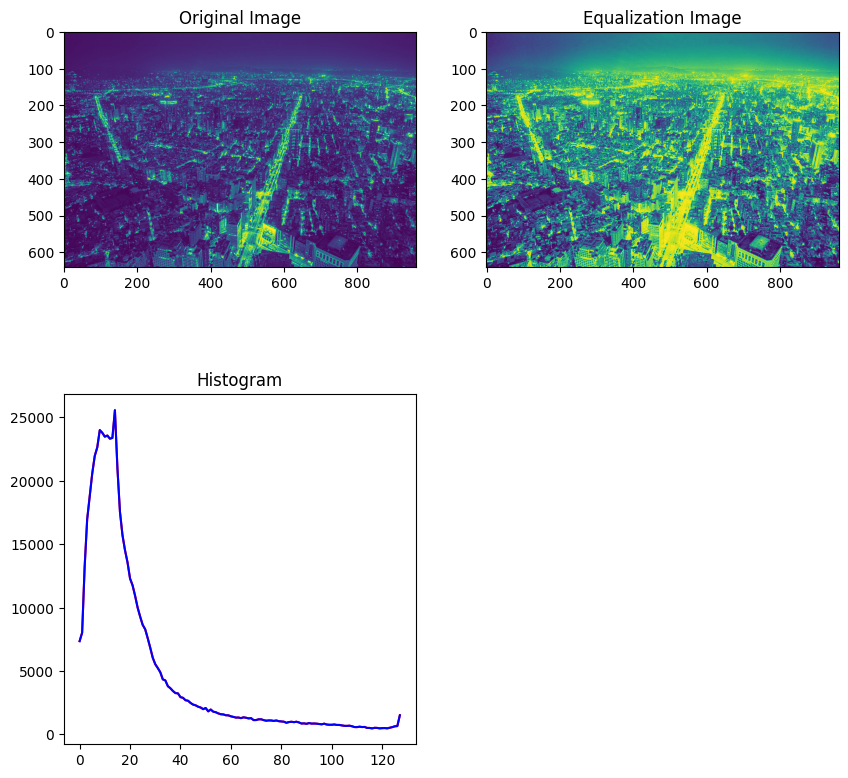

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(night_01)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(night_cdf)
plt.title('Equalization Image')

plt.subplot(223)
plt.plot(night_hist, color='r')
plt.plot(night_cdf_hist, color='b')
plt.title('Histogram')
plt.show()

# OpenCV를 이용한 평탄화
* cv2.equalizeHist()

In [ ]:
night_02=cv2.imread('/content/night.jpg',0)

In [ ]:
night_02_equ=cv2.equalizeHist(night_02)

In [ ]:
night_02_hist = cv2.calcHist([night_02], [0], None, [128], [0,256])
night_02_equ_hist = cv2.calcHist([night_02_equ], [0], None, [128], [0,256])

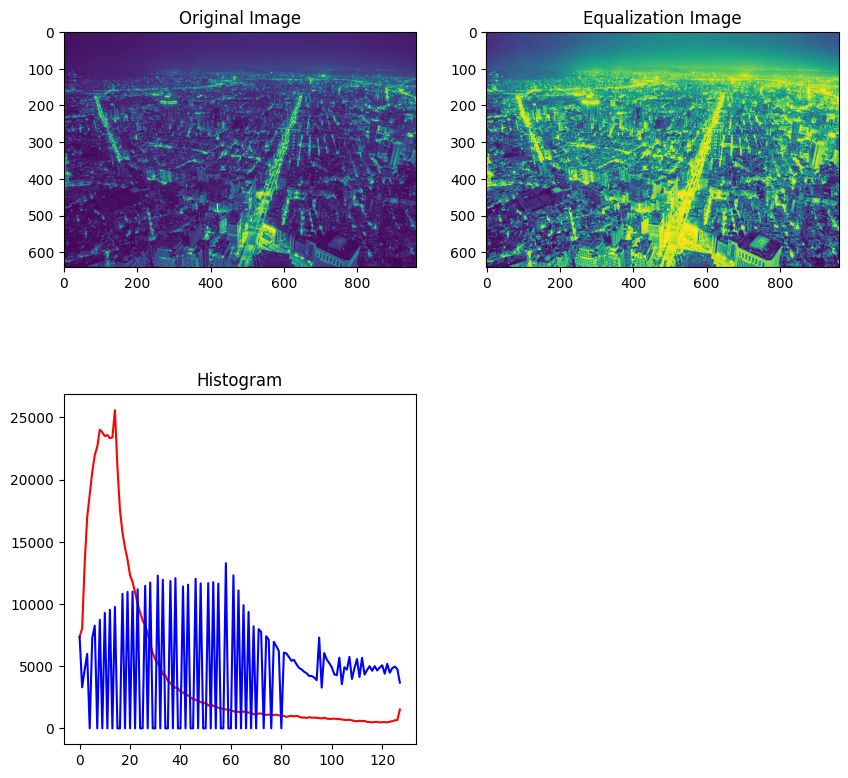

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(night_02)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(night_02_equ)
plt.title('Equalization Image')

plt.subplot(223)
plt.plot(night_02_hist, color='r')
plt.plot(night_02_equ_hist, color='b')
plt.title('Histogram')
plt.show()

# 이미지처리(Image Processing)
* 크기 변환, 위치 변환, 회전, 대칭 ...
* resize(), flip(), getAffineTransform(), wrapAffine() ...

# Resize
* cv2.resize
* pixel 사이 값의 변화 => 값의 결정
* 보간법
 - 사이즈 작게 할때: cv2.INTER_AREA
 - 사이즈 크게 할때: cv2.INTER_CUBIC, cv2.INTER_LINEAR

* image
* dsize : manual size(가로, 세로 크기, tuple(100,200))
* fx : 가로사이즈 배수(2:2배, 0.1:0.1배)
* fy : 세로사이즈 배수
* interpolation : 보간법

In [ ]:
print(image.shape)

(640, 960, 3)


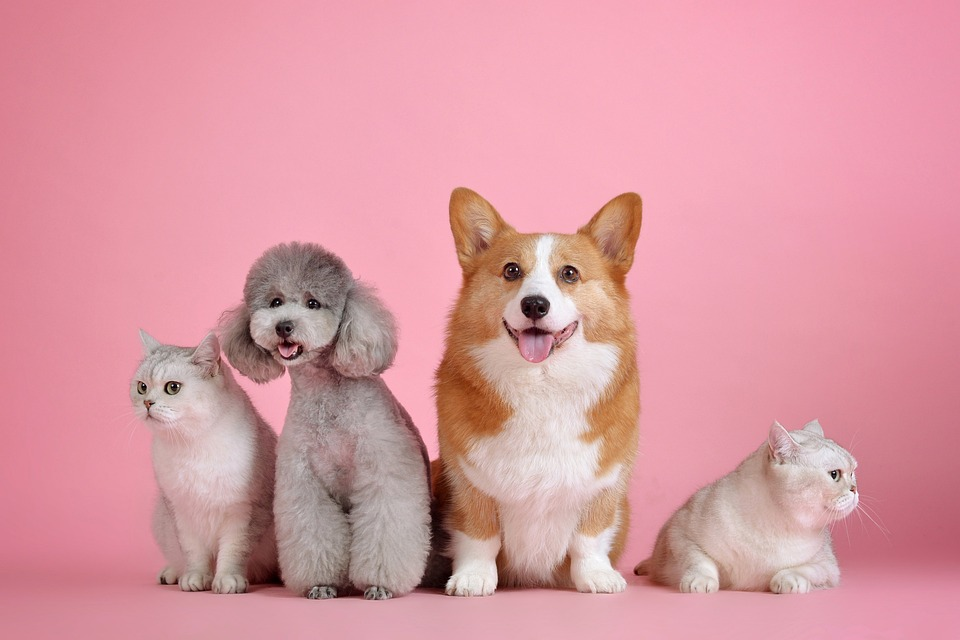

In [ ]:
cv2_imshow(image)

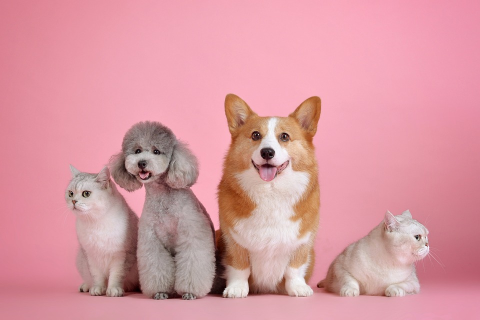

(320, 480, 3)


In [ ]:
# 크기 변환
zoom1 = cv2.resize(image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
cv2_imshow(zoom1)
print(zoom1.shape)

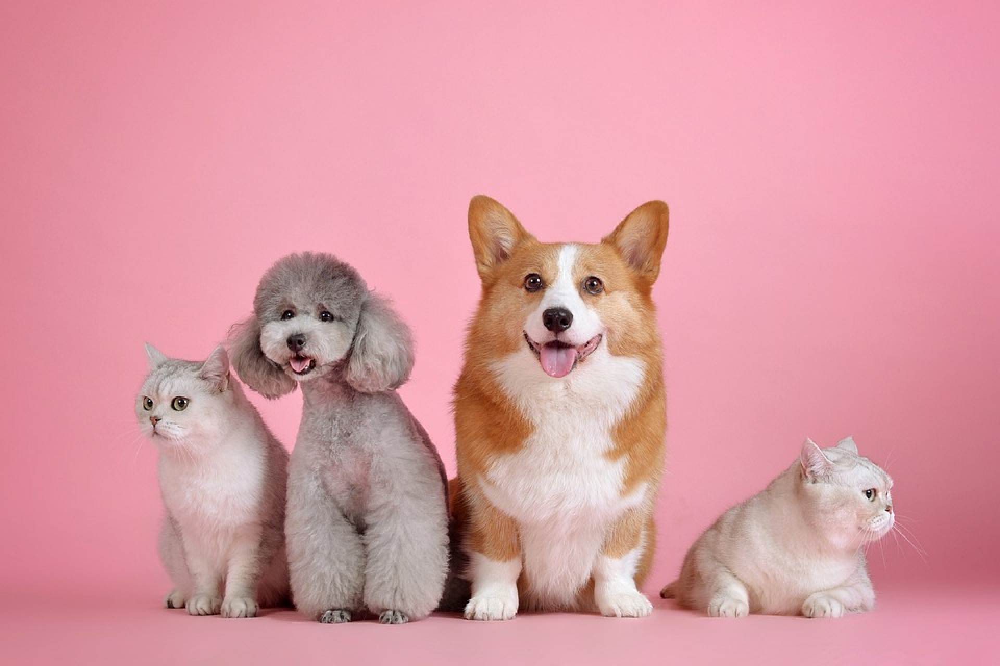

(1280, 1920, 3)


In [ ]:
zoom2 = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_AREA)
cv2_imshow(zoom2)
print(zoom2.shape)

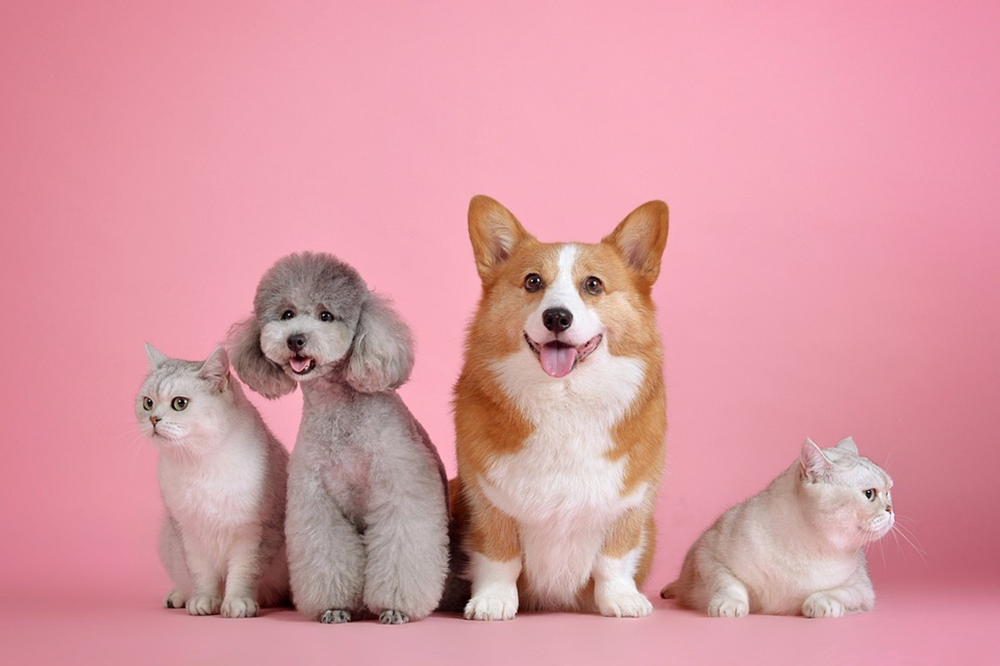

(1280, 1920, 3)


In [ ]:
zoom3 = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
cv2_imshow(zoom3)
print(zoom3.shape)

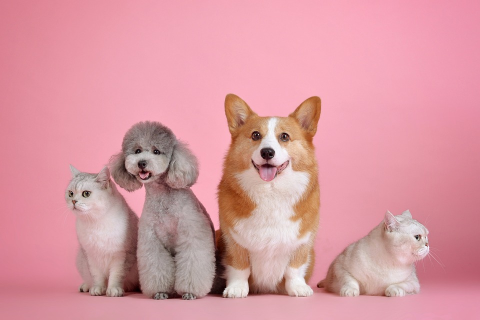

(320, 480, 3)


In [ ]:
zoom4 = cv2.resize(image, None, fx=0.5, fy=0.5) # interpolation 생략해도 나옴
cv2_imshow(zoom4)
print(zoom4.shape)

# 이미지 위치 변경(Translation)
* cv2.warpAffine()
* src : image
* M : 변환행렬
* dsize : tuple(columns, rows)

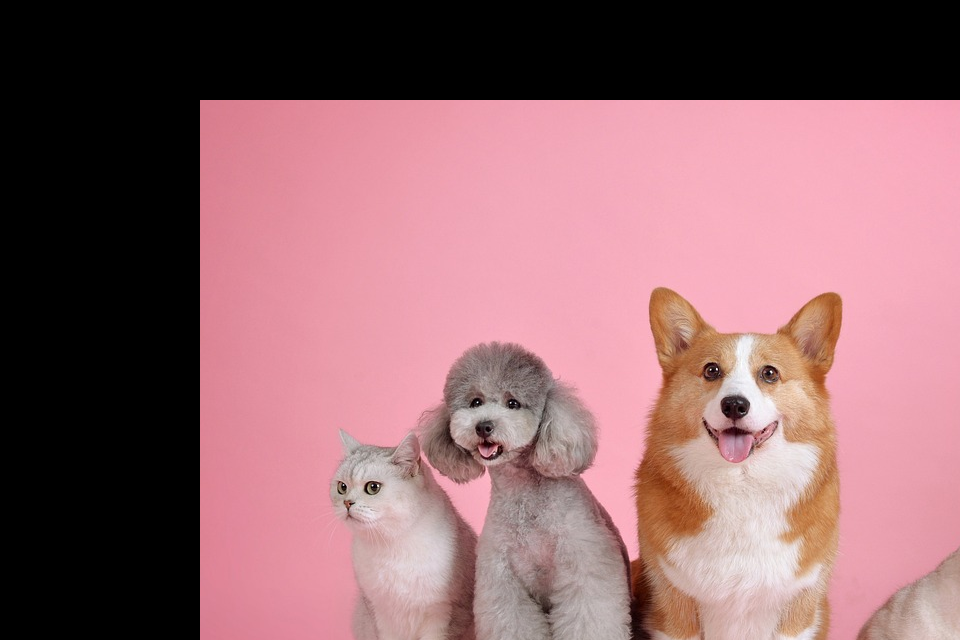

In [ ]:
rows, cols=image.shape[:2]
M=np.float32([[1,0,200],[0,1,100]])
# 1,0,a : 가로방향으로 a만큼 이동
# 0,1,b : 세로방향으로 b만큼 이동
image_t=cv2.warpAffine(image,M,(cols, rows))
cv2_imshow(image_t)

# 이미지 회전(Rotate)
* 한점을 기준으로 특정 각도만큼 회전
 - 방향 기준 : 시계반대방향
* cv2.getRotationMatrix2D()
* center : 중심좌표
* angle : 회전각도(시계반대방향)
* scale : scale factor

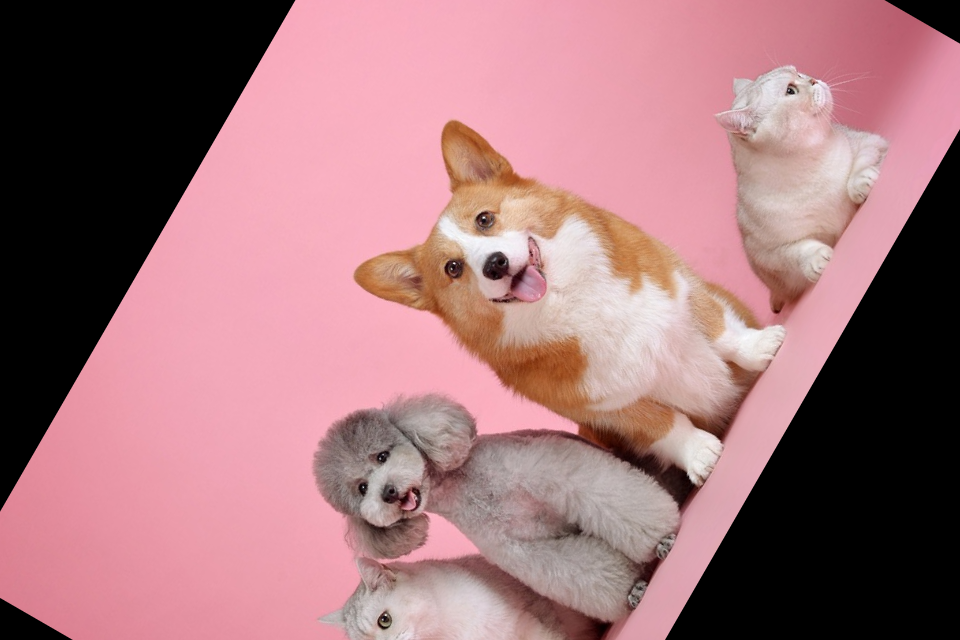

In [ ]:
rows, cols = image.shape[:2]
M1 = cv2.getRotationMatrix2D((cols/2, rows/2), 60, 1)
image_r = cv2.warpAffine(image, M1, (cols, rows))
cv2_imshow(image_r)

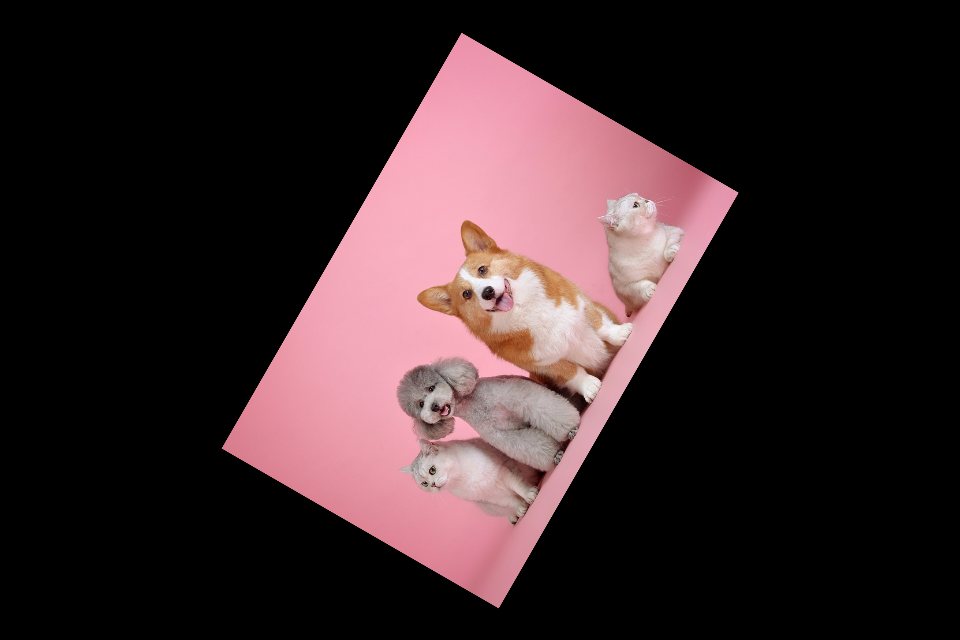

In [ ]:
rows, cols = image.shape[:2]
M2 = cv2.getRotationMatrix2D((cols/2, rows/2), 60, 0.5)
image_r2 = cv2.warpAffine(image, M2, (cols, rows))
cv2_imshow(image_r2)

# 대칭변환
* Flip
* cv2.flip()
* src : image
* 좌우대칭, 상하대칭
* flipCide : 대칭방법을 결정하는 flag
 - 양수 : 좌우대칭
 - 0 : 상하대칭
 - 음수 : 좌우,상하대칭

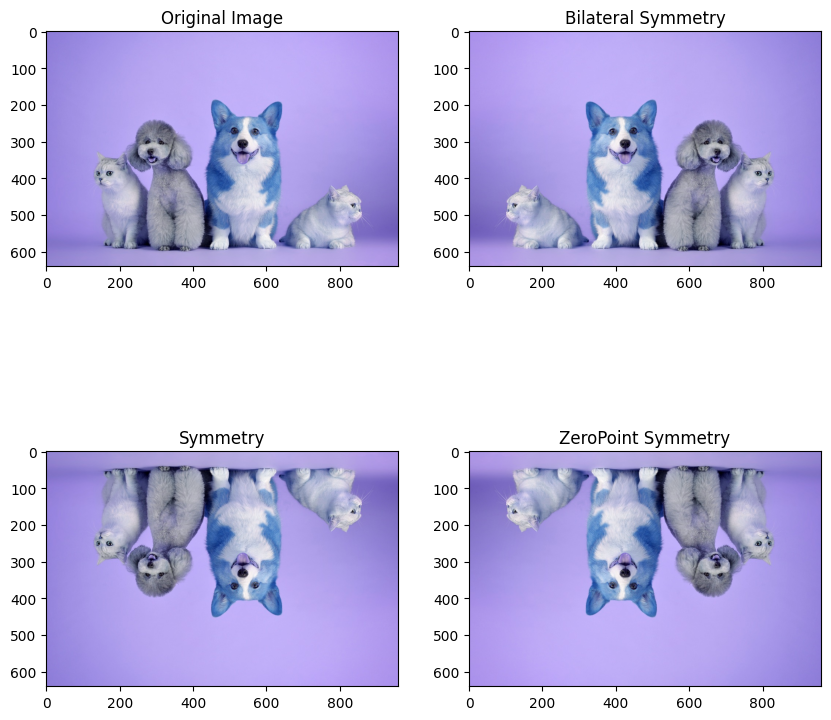

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(222)
image_f1=cv2.flip(image,1)
plt.imshow(image_f1)
plt.title('Bilateral Symmetry')

plt.subplot(223)
image_f2=cv2.flip(image,0)
plt.imshow(image_f2)
plt.title('Symmetry')

plt.subplot(224)
image_f3=cv2.flip(image,-1)
plt.imshow(image_f3)
plt.title('ZeroPoint Symmetry')

plt.show()

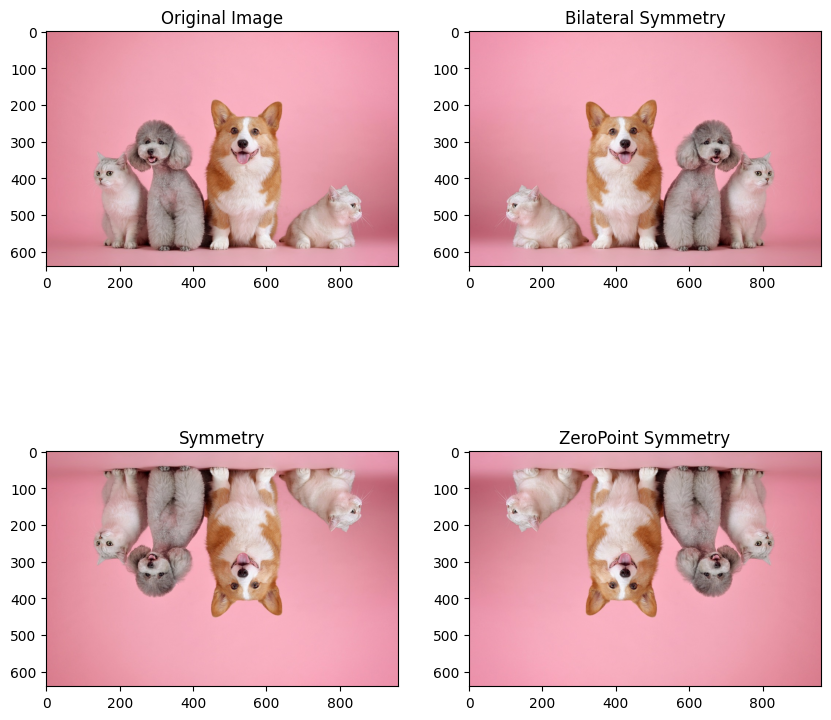

In [ ]:
image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(222)
image_f1=cv2.flip(image,1)
plt.imshow(image_f1)
plt.title('Bilateral Symmetry')

plt.subplot(223)
image_f2=cv2.flip(image,0)
plt.imshow(image_f2)
plt.title('Symmetry')

plt.subplot(224)
image_f3=cv2.flip(image,-1)
plt.imshow(image_f3)
plt.title('ZeroPoint Symmetry')

plt.show()